[link text](https://)

### **Principal Component Analysis and Raisin Class using Machine Learning**

INSE 6220 Final Project

Xinyue Yu

Student ID: 40243744

**Import Libraries**

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [5]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**

The Raisin dataset used for Principal Component Analysis and classification models is obtained from Kaggle. The data set provides information about the class of raisin to be determined as Kecimen or Besni. 

In the dataset, there are 900 entries with 7 features for classification.
0 represents Kecimen and 1 represent Besni.

All features are numerical features.

The original dataset can be found on below link: https://www.kaggle.com/datasets/shrutisaxena/raisin-dataset

In [6]:
#read cvs file into dataframe
df = pd.read_csv('Raisin_Dataset.csv')
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,0
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,0
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,0
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,0
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,0
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,0
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,0
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,0
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,0
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,0


In [7]:
len(df.index)

900

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   Class            900 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 56.4 KB


In [9]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [10]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

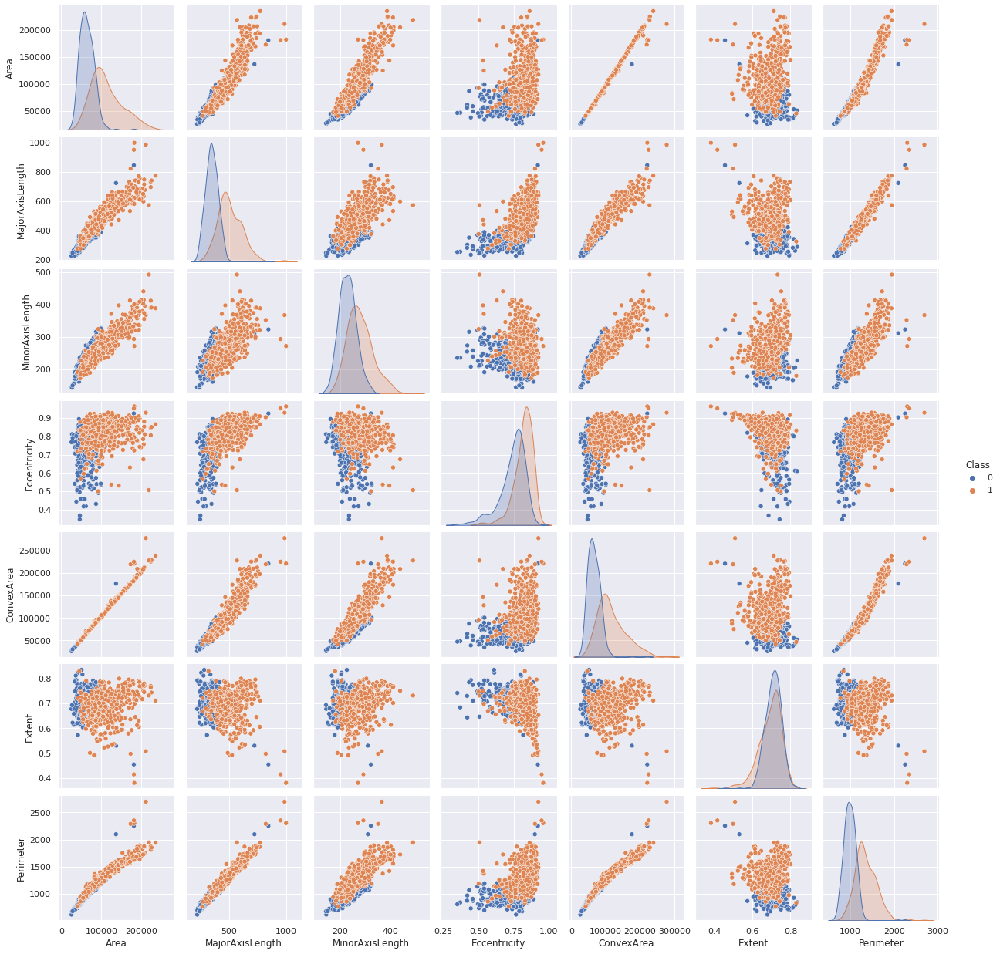

In [11]:
sns.pairplot(df, hue='Class')
plt.show()

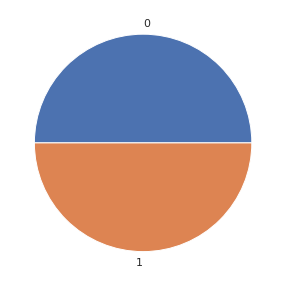

In [12]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [13]:
X = df.drop(columns=['Class'])
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544


In [14]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,87804.127778,39002.111390,25387.000000,59348.000000,78902.000000,105028.250000,235047.000000
MajorAxisLength,900.0,430.929950,116.035121,225.629541,345.442898,407.803951,494.187014,997.291941
MinorAxisLength,900.0,254.488133,49.988902,143.710872,219.111126,247.848409,279.888575,492.275279
Eccentricity,900.0,0.781542,0.090318,0.348730,0.741766,0.798846,0.842571,0.962124
ConvexArea,900.0,91186.090000,40769.290132,26139.000000,61513.250000,81651.000000,108375.750000,278217.000000
Extent,900.0,0.699508,0.053468,0.379856,0.670869,0.707367,0.734991,0.835455
Perimeter,900.0,1165.906636,273.764315,619.074000,966.410750,1119.509000,1308.389750,2697.753000


**Standardize the Data**

In [15]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,-0.007186,0.097577,-0.023958,0.423142,-0.015709,1.106743,0.066274
1,-0.324217,-0.209012,-0.229292,0.224476,-0.304248,-0.287777,-0.161252
2,0.078292,0.097758,0.236988,0.186239,0.062113,-1.158250,0.155945
3,-1.074286,-1.245051,-0.915273,-1.069623,-1.076165,0.001711,-1.175915
4,-0.215393,-0.678958,0.727354,-2.409827,-0.238623,1.745259,-0.338639
5,-0.989269,-0.972699,-1.088166,-0.046427,-0.977212,-0.768202,-1.038224
6,-1.162433,-1.041504,-1.568353,0.460367,-1.160393,-0.629029,-1.250349
7,-0.688862,-0.849133,-0.381463,-0.836226,-0.708208,0.825066,-0.849891
8,-1.168487,-0.929031,-1.639519,0.708518,-1.139802,-0.027639,-1.155572
9,-0.600920,-0.551563,-0.534746,0.027845,-0.615047,-0.657433,-0.673810


In [16]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,1.894781e-16,1.000556,-1.601242,-0.730010,-0.228374,0.441866,3.777353
MajorAxisLength,900.0,0.000000e+00,1.000556,-1.770279,-0.737144,-0.199413,0.545458,4.883667
MinorAxisLength,900.0,-8.210716e-16,1.000556,-2.217269,-0.708091,-0.132898,0.508404,4.759444
Eccentricity,900.0,6.947529e-16,1.000556,-4.794739,-0.440641,0.191694,0.676084,2.000508
ConvexArea,900.0,6.315935e-17,1.000556,-1.596379,-0.728228,-0.234009,0.421867,4.590095
Extent,900.0,1.436875e-15,1.000556,-5.981678,-0.535921,0.147067,0.664006,2.543983
Perimeter,900.0,-6.315935e-17,1.000556,-1.998568,-0.729119,-0.169574,0.520748,5.598604


**Observations and variables**

In [17]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

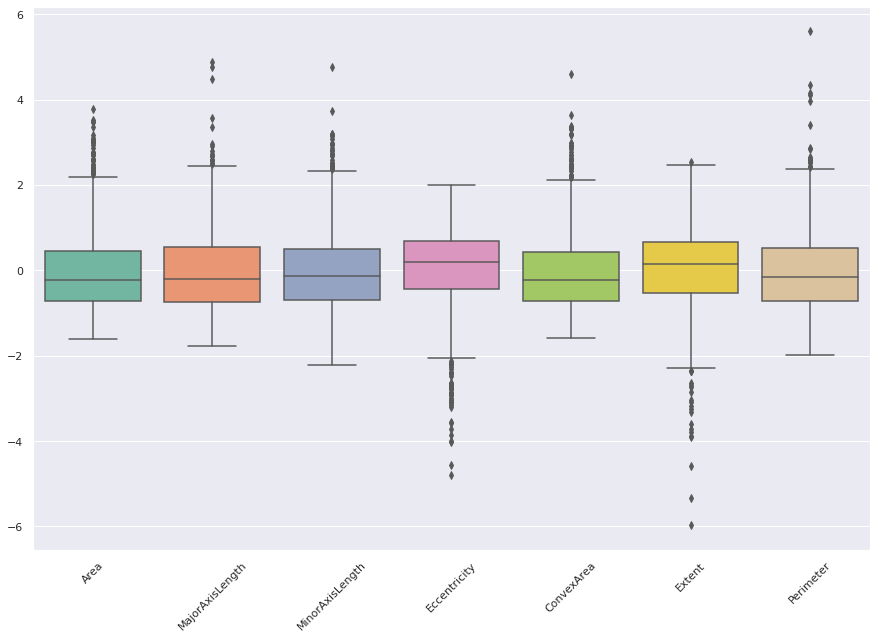

In [18]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

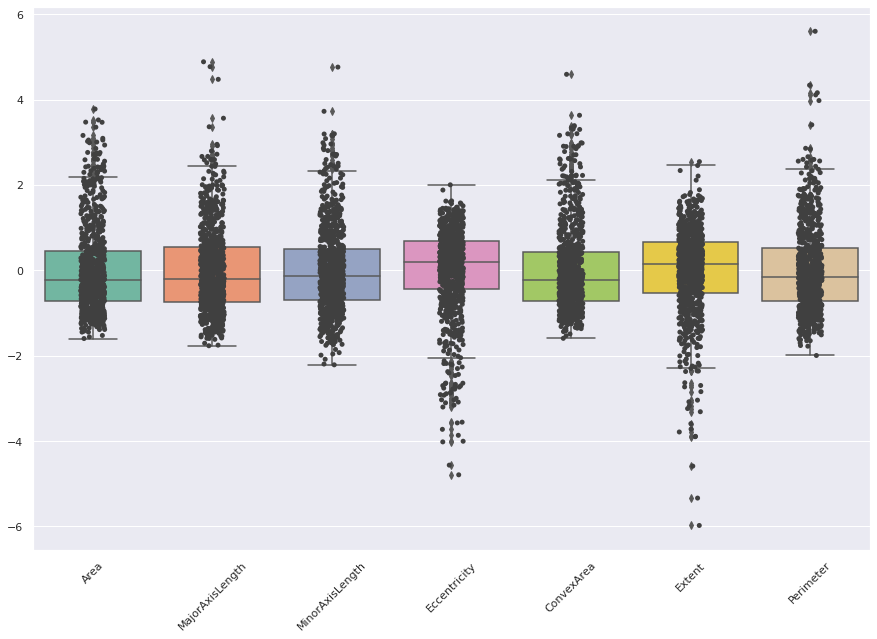

In [19]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

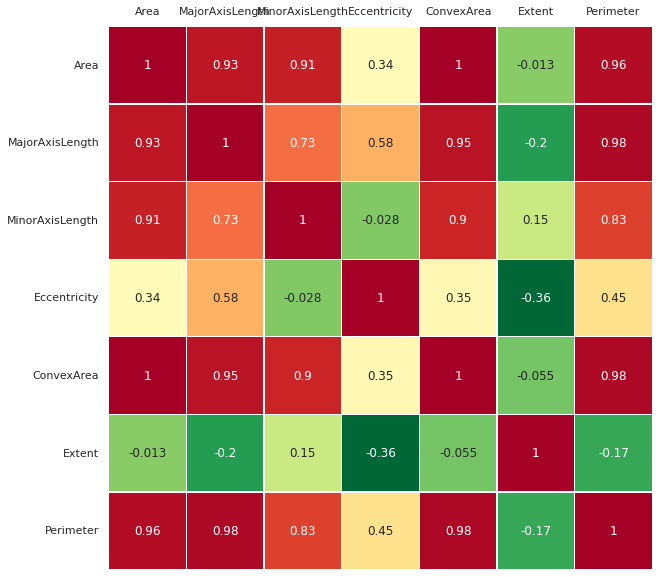

In [20]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

### **Principal Component Analysis (PCA)**

Text(0, 0.5, '')

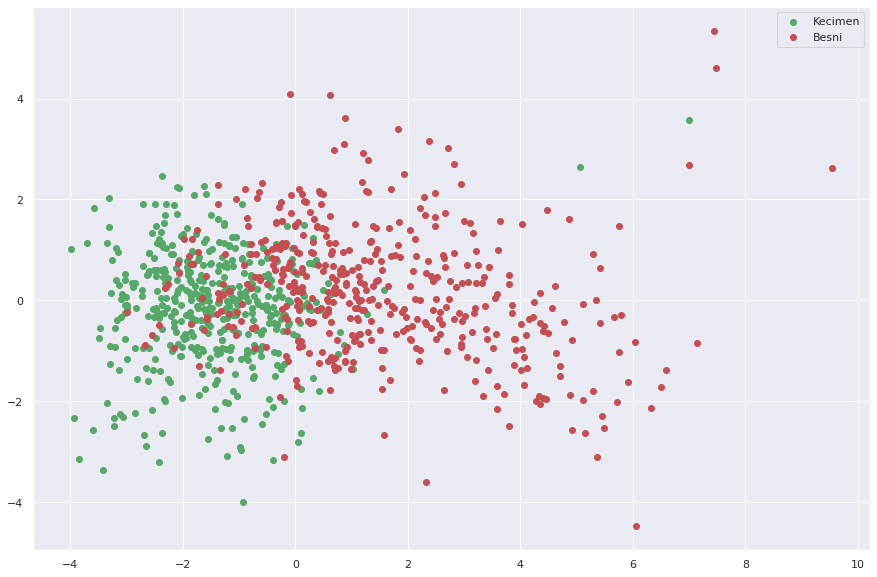

In [21]:
pca = PCA()
Z = pca.fit_transform(X)

# (Besni)->1,  (Kecimen)->0

idx_Kecimen= np.where(y == 0)
idx_Besni = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='g', label='Kecimen')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='r', label='Besni')


plt.legend()
plt.xlabel('')
plt.ylabel('')

**Eigenvectors**

array([[ 0.44828422, -0.11609991,  0.00548378, -0.11113906, -0.61104765,
        -0.09983439, -0.62436686],
       [ 0.4432398 ,  0.13658724, -0.10054797,  0.49520464,  0.08757032,
        -0.68557712,  0.22772863],
       [ 0.38938118, -0.37492246,  0.23604354, -0.6558767 ,  0.38457775,
        -0.2390332 ,  0.12995283],
       [ 0.20297098,  0.61082321, -0.62852206, -0.42629865,  0.07510412,
         0.05356014,  0.02044403],
       [ 0.45093833, -0.08761633,  0.0366724 ,  0.0558117 , -0.39241075,
         0.47120104,  0.63914127],
       [-0.05636836, -0.66734439, -0.73198093,  0.10905256,  0.05685884,
         0.02345199, -0.00161639],
       [ 0.45082374,  0.03417227,  0.04430077,  0.3398651 ,  0.5551508 ,
         0.48726906, -0.36399975]])

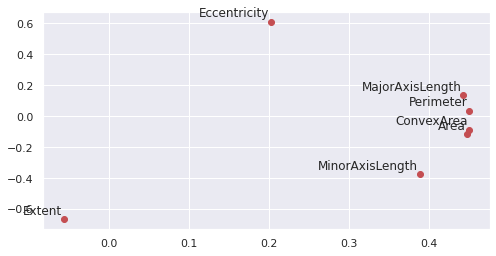

In [22]:
A = pca.components_.T 
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('')
plt.ylabel('')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

**Scree plot**

/usr/local/lib/python3.8/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


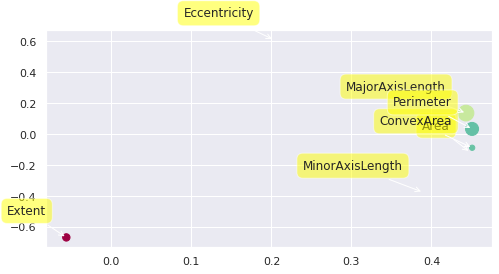

In [23]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('')
plt.ylabel('')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

array([4.83766379e+00, 1.45480489e+00, 6.29148522e-01, 5.68877209e-02,
       2.18325269e-02, 6.43734371e-03, 1.01163378e-03])

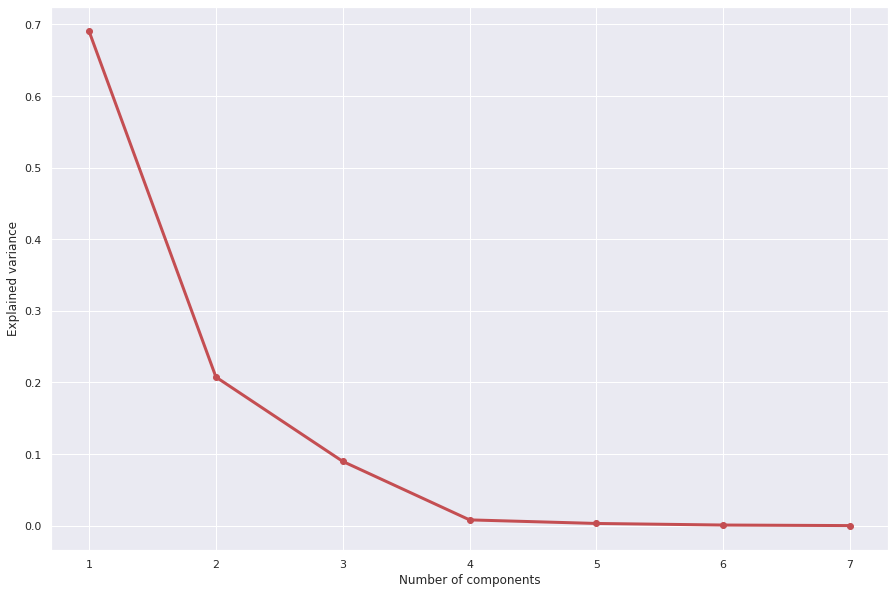

In [24]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

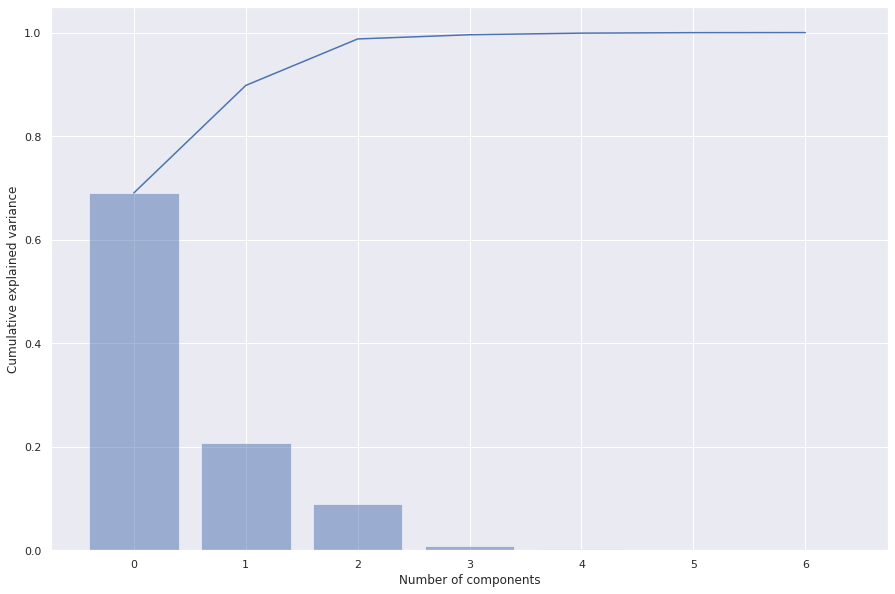

In [25]:

ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
     

**Biplot**

array([-4.53328089e-01,  4.45368368e-01,  8.02008139e-01, -3.02563631e-01,
       -2.96776301e+00,  9.24411879e-01,  1.34063710e+00, -9.21366416e-01,
        1.13506065e+00,  6.81523300e-01,  1.04556343e+00,  5.90230725e-01,
       -1.53326945e-01, -3.08398943e+00,  2.17438854e-01,  8.09003134e-01,
        2.40283347e-01, -3.24187105e-02,  5.19283272e-01,  4.94038098e-01,
       -9.76196977e-01, -3.33467933e-01, -2.55683878e-01, -1.93447544e+00,
       -1.86304331e-01, -9.84134587e-01, -2.53403074e+00, -1.80985327e-01,
       -2.90990507e+00, -2.72923663e-01, -7.13686609e-01,  9.47521743e-01,
       -1.06642690e+00, -4.74512728e-01, -2.49299302e+00, -2.03607804e+00,
       -8.68979157e-01,  2.11537306e+00, -9.81907359e-02, -1.60187820e+00,
       -2.13918053e+00, -6.38506342e-01, -9.46798550e-01, -3.17041937e+00,
        1.58097964e+00,  3.89889395e-01, -2.88802500e-01, -2.34187568e+00,
        5.55485028e-01,  1.40089791e-01,  1.36318999e+00,  2.13310172e-01,
        1.91845642e+00,  

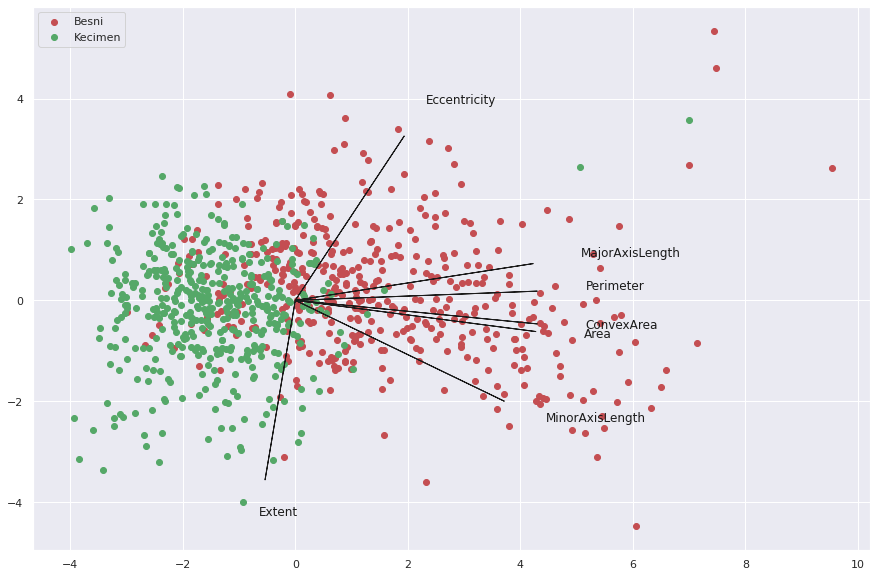

In [26]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('')
plt.ylabel('')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='r', label='Besni')
plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='g', label='Kecimen')

plt.legend(loc='upper left')
Z1
Z2

### **Using PCA Library**

In [27]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [28]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [29]:
out['PC']

,PC1,PC2,PC3
0,0.076994,-0.453328,-1.089214
1,-0.475376,0.445368,0.016372
2,0.372109,0.802008,0.786487
3,-2.622445,-0.302564,0.482721
4,-0.962054,-2.967763,0.452154
...,...,...,...
895,-0.114629,0.694645,0.129914
896,0.273577,0.953934,0.696489
897,0.682451,-1.308199,0.091732
898,0.648410,0.979248,0.091413


**Scatter plot**

[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fee04671eb0>)

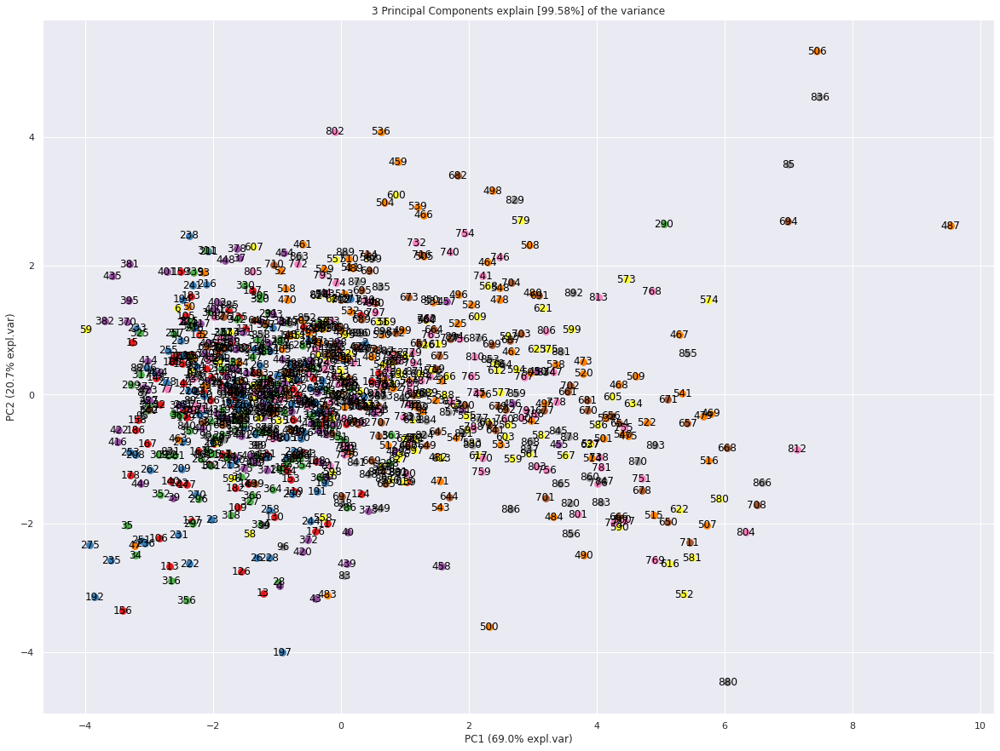

In [30]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [31]:
A = out['loadings'].T
A

,PC1,PC2,PC3
Area,0.448284,-0.116100,0.005484
MajorAxisLength,0.443240,0.136587,-0.100548
MinorAxisLength,0.389381,-0.374922,0.236044
Eccentricity,0.202971,0.610823,-0.628522
ConvexArea,0.450938,-0.087616,0.036672
Extent,-0.056368,-0.667344,-0.731981
Perimeter,0.450824,0.034172,0.044301


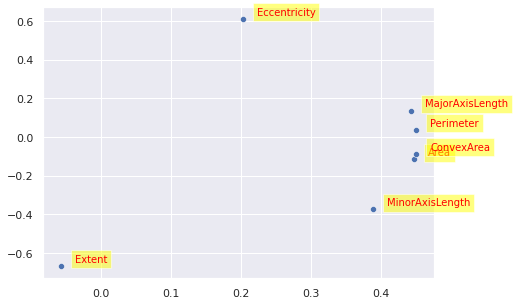

In [32]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('')
plt.ylabel('')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

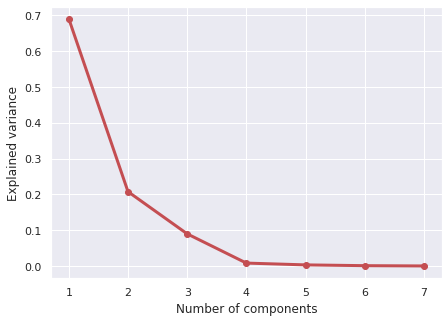

In [33]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

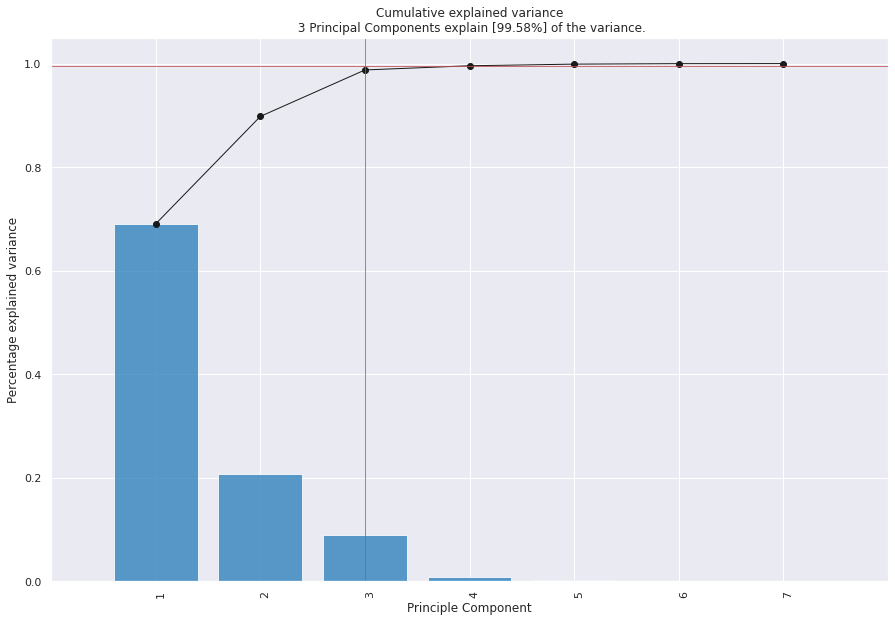

<Figure size 504x360 with 0 Axes>

In [34]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


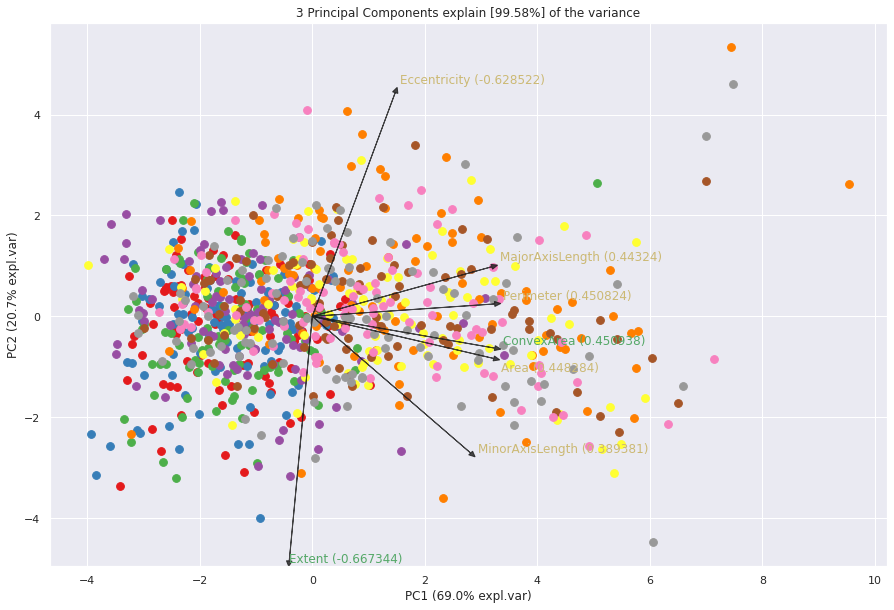

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fee12621130>)

In [35]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


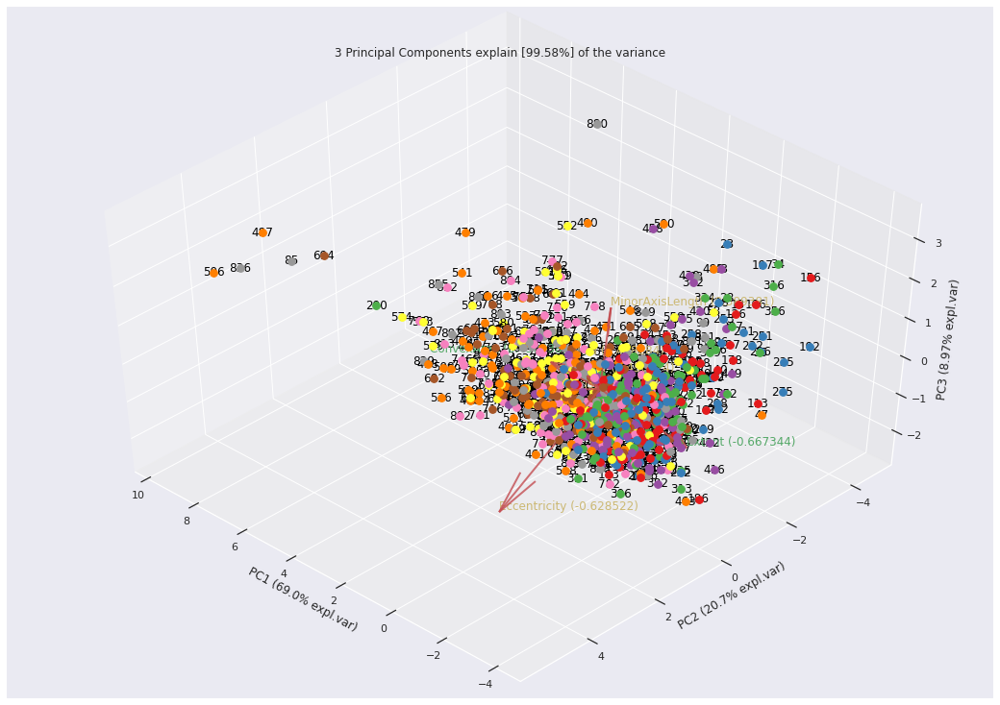

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7fee053fde80>)

In [36]:
model.biplot3d(legend=False)

### **Classification using Pycaret**

The original dataset the split into train and test set with 70% and 30% respectively. Using the python library PyCaret, the most popular classification models are compared. Then, the models with the highest accurancy can be identified. Before applying PCA, the best performing models are Linear Regression, Extra Trees Classifier and Random Forest Classfier. After performing PCA, the models with the highest accurancy are K-Nearest Neighbors, Linear Regression and Ridge Classfier and Linear Discriminant Analysis having the same accuracy. Therefore, the K-Nearest Neighbors, Linear REgression and Linear Discriminant Analysis are selected for further experiment.

In [37]:
pip install pycaret

In [38]:
from pycaret.utils import version
version()

'2.3.10'

In [39]:
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [40]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (810, 8)
Unseen Data For Predictions: (90, 8)


In [41]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='Class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

**Comparing All Models**

In [42]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8852,0.9384,0.8634,0.9065,0.8829,0.7704,0.7736,0.364
et,Extra Trees Classifier,0.8763,0.9296,0.8387,0.9114,0.8720,0.7528,0.7572,0.181
rf,Random Forest Classifier,0.8693,0.9251,0.8246,0.9096,0.8635,0.7387,0.7439,0.226
gbc,Gradient Boosting Classifier,0.8641,0.9228,0.8248,0.9018,0.8586,0.7282,0.7346,0.129
lda,Linear Discriminant Analysis,0.8623,0.9286,0.8600,0.8695,0.8630,0.7245,0.7274,0.013
ridge,Ridge Classifier,0.8605,0.0000,0.8461,0.8775,0.8591,0.7210,0.7251,0.014
qda,Quadratic Discriminant Analysis,0.8603,0.9246,0.8036,0.9093,0.8519,0.7209,0.7273,0.014
lightgbm,Light Gradient Boosting Machine,0.8568,0.9227,0.8280,0.8819,0.8533,0.7136,0.7160,0.132
ada,Ada Boost Classifier,0.8534,0.9106,0.8283,0.8774,0.8509,0.7069,0.7097,0.109
nb,Naive Bayes,0.8377,0.9099,0.7618,0.9033,0.8254,0.6757,0.6854,0.015


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


In [43]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**K-Nearest Neighbors**

In [44]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7895,0.8362,0.7586,0.8148,0.7857,0.5793,0.5808
1,0.8070,0.8411,0.7586,0.8462,0.8000,0.6146,0.6181
2,0.8421,0.9033,0.8276,0.8571,0.8421,0.6843,0.6847
3,0.7368,0.8282,0.6897,0.7692,0.7273,0.4745,0.4771
4,0.7193,0.7599,0.6897,0.7407,0.7143,0.4391,0.4402
5,0.9123,0.9452,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.7321,0.8125,0.7143,0.7407,0.7273,0.4643,0.4646
7,0.8750,0.9018,0.8214,0.9200,0.8679,0.7500,0.7543
8,0.8393,0.9043,0.9286,0.7879,0.8525,0.6786,0.6897


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


In [45]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7895,0.8091,0.7241,0.8400,0.7778,0.5799,0.5856
1,0.8421,0.8695,0.7586,0.9167,0.8302,0.6851,0.6958
2,0.8070,0.9119,0.7241,0.8750,0.7925,0.6151,0.6247
3,0.7719,0.8331,0.6552,0.8636,0.7451,0.5457,0.5628
4,0.6842,0.7716,0.6897,0.6897,0.6897,0.3682,0.3682
5,0.8947,0.9255,0.7857,1.0000,0.8800,0.7886,0.8069
6,0.7857,0.8418,0.7143,0.8333,0.7692,0.5714,0.5774
7,0.8929,0.9126,0.7857,1.0000,0.8800,0.7857,0.8044
8,0.8750,0.9286,0.8571,0.8889,0.8727,0.7500,0.7505


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=8, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


**Tune the model**

In [46]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=8, p=2,
                     weights='uniform')

**Evaluate K-Nearest Neighbors**

In [47]:
evaluate_model(tuned_knn)

**Create model with Logistic Regression**

In [48]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8421,0.8682,0.8621,0.8333,0.8475,0.6839,0.6843
1,0.8947,0.9421,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8947,0.9631,0.9310,0.8710,0.9000,0.7891,0.7911
3,0.8246,0.9212,0.7241,0.9130,0.8077,0.6503,0.6651
4,0.8947,0.9323,0.8621,0.9259,0.8929,0.7897,0.7916
5,0.9474,0.9717,0.8929,1.0000,0.9434,0.8945,0.8995
6,0.8393,0.9298,0.8214,0.8519,0.8364,0.6786,0.6790
7,0.8750,0.9439,0.8214,0.9200,0.8679,0.7500,0.7543
8,0.9464,0.9783,0.9643,0.9310,0.9474,0.8929,0.8934


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune model with Logistic Regression**

In [49]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8421,0.8682,0.8621,0.8333,0.8475,0.6839,0.6843
1,0.9123,0.9421,0.8621,0.9615,0.9091,0.8248,0.8294
2,0.8947,0.9618,0.9310,0.8710,0.9000,0.7891,0.7911
3,0.8246,0.9212,0.7241,0.9130,0.8077,0.6503,0.6651
4,0.8947,0.9323,0.8621,0.9259,0.8929,0.7897,0.7916
5,0.9474,0.9717,0.8929,1.0000,0.9434,0.8945,0.8995
6,0.8393,0.9298,0.8214,0.8519,0.8364,0.6786,0.6790
7,0.8750,0.9439,0.8214,0.9200,0.8679,0.7500,0.7543
8,0.9464,0.9783,0.9643,0.9310,0.9474,0.8929,0.8934


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [50]:
tuned_lr

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate model with Logistic Regression**

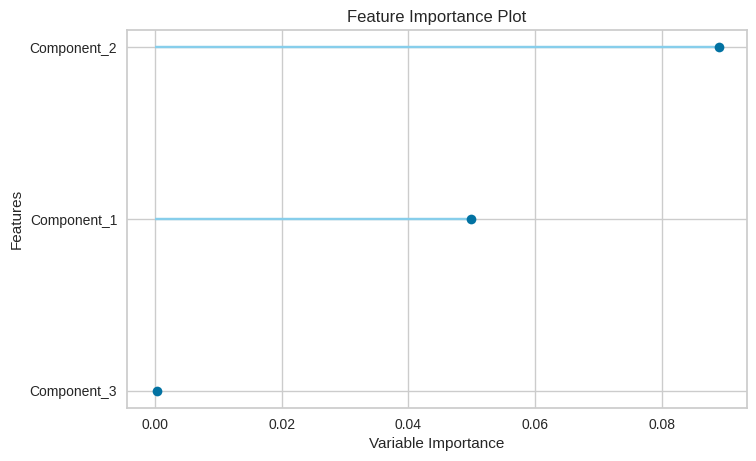

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [51]:
evaluate_model(tuned_lr)

**Create model with Linear Discriminant Analysis**

In [52]:
lda=create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7895,0.8633,0.7931,0.7931,0.7931,0.5788,0.5788
1,0.8947,0.9433,0.8966,0.8966,0.8966,0.7894,0.7894
2,0.8421,0.9483,0.8966,0.8125,0.8525,0.6835,0.6874
3,0.8421,0.9064,0.7931,0.8846,0.8364,0.6847,0.6885
4,0.8421,0.8953,0.8276,0.8571,0.8421,0.6843,0.6847
5,0.9123,0.9791,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8571,0.9298,0.8929,0.8333,0.8621,0.7143,0.7161
7,0.8571,0.9260,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.9286,0.9668,0.9643,0.9000,0.9310,0.8571,0.8593


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)
INFO:logs:create_model() succesfully completed......................................


**Tune LDA Model**

In [53]:
tuned_lda=tune_model(lda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8246,0.8559,0.7586,0.8800,0.8148,0.6499,0.6563
1,0.8947,0.9323,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8421,0.9446,0.8621,0.8333,0.8475,0.6839,0.6843
3,0.8070,0.9076,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8596,0.8953,0.8276,0.8889,0.8571,0.7196,0.7213
5,0.9123,0.9815,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8750,0.9337,0.8929,0.8621,0.8772,0.7500,0.7505
7,0.8393,0.9235,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9286,0.9617,0.8929,0.9615,0.9259,0.8571,0.8593


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage='auto',
                           solver='lsqr', store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate LDA Model**

In [54]:
tuned_lda

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage='auto',
                           solver='lsqr', store_covariance=False, tol=0.0001)

In [55]:
evaluate_model(tuned_lda)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage='auto',
                           solver='lsqr', store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [56]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### **Classification + PCA**

In [57]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='Class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='Class')),
                ('fix_perfect', Remove_100(target='Class')),
                ('clean_names', Clean_Colum_Names()),
       

### **Comparing Models**

In [58]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.8604,0.9060,0.8108,0.9032,0.8541,0.7211,0.7255,0.050
lr,Logistic Regression,0.8570,0.9206,0.8424,0.8748,0.8561,0.7139,0.7179,0.018
ridge,Ridge Classifier,0.8569,0.0000,0.7969,0.9102,0.8486,0.7142,0.7212,0.013
lda,Linear Discriminant Analysis,0.8569,0.9213,0.7969,0.9102,0.8486,0.7142,0.7212,0.019
lightgbm,Light Gradient Boosting Machine,0.8553,0.9056,0.8283,0.8792,0.8517,0.7107,0.7137,0.082
nb,Naive Bayes,0.8552,0.9199,0.7933,0.9089,0.8467,0.7107,0.7171,0.015
ada,Ada Boost Classifier,0.8517,0.9077,0.8145,0.8839,0.8465,0.7036,0.7076,0.181
qda,Quadratic Discriminant Analysis,0.8463,0.9112,0.7865,0.8994,0.8370,0.6930,0.7011,0.022
rf,Random Forest Classifier,0.8429,0.9069,0.8004,0.8800,0.8366,0.6859,0.6909,0.385
gbc,Gradient Boosting Classifier,0.8412,0.9094,0.8144,0.8657,0.8376,0.6824,0.6858,0.218


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:compare_models() succesfully completed......................................


### **Best model with PCA**

In [59]:
best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

### **Tune Best Model**

In [60]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8421,0.9002,0.7586,0.9167,0.8302,0.6851,0.6958
1,0.8772,0.8904,0.8621,0.8929,0.8772,0.7545,0.7549
2,0.8772,0.9655,0.8621,0.8929,0.8772,0.7545,0.7549
3,0.8070,0.9317,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8596,0.8849,0.8276,0.8889,0.8571,0.7196,0.7213
5,0.9298,0.9446,0.8571,1.0000,0.9231,0.8593,0.8679
6,0.8393,0.9082,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8929,0.9267,0.8571,0.9231,0.8889,0.7857,0.7877
8,0.9286,0.9528,0.8929,0.9615,0.9259,0.8571,0.8593


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


### **Evaluate Best Model**

In [61]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................
INFO:logs:plot_model() succesfully completed......................................


In [62]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8070,0.8959,0.7586,0.8462,0.8000,0.6146,0.6181
1,0.8947,0.8947,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8947,0.9501,0.8621,0.9259,0.8929,0.7897,0.7916
3,0.8421,0.8990,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.7895,0.8713,0.7241,0.8400,0.7778,0.5799,0.5856
5,0.9298,0.9163,0.8571,1.0000,0.9231,0.8593,0.8679
6,0.8571,0.8858,0.7857,0.9167,0.8462,0.7143,0.7217
7,0.8571,0.8852,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.9286,0.9630,0.8929,0.9615,0.9259,0.8571,0.8593


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


### **Tune Model**

In [63]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8421,0.9002,0.7586,0.9167,0.8302,0.6851,0.6958
1,0.8772,0.8904,0.8621,0.8929,0.8772,0.7545,0.7549
2,0.8772,0.9655,0.8621,0.8929,0.8772,0.7545,0.7549
3,0.8070,0.9317,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8596,0.8849,0.8276,0.8889,0.8571,0.7196,0.7213
5,0.9298,0.9446,0.8571,1.0000,0.9231,0.8593,0.8679
6,0.8393,0.9082,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8929,0.9267,0.8571,0.9231,0.8889,0.7857,0.7877
8,0.9286,0.9528,0.8929,0.9615,0.9259,0.8571,0.8593


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


### **Evaluate Model**

In [64]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')

In [85]:
evaluate_model(tuned_knn_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

INFO:logs:plot_model() succesfully completed......................................
INFO:logs:plot_model() succesfully completed......................................


### **Create Logistic Regression Model**

In [66]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7544,0.8547,0.7586,0.7586,0.7586,0.5086,0.5086
1,0.8947,0.9224,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8596,0.9446,0.9310,0.8182,0.8710,0.7185,0.7257
3,0.8421,0.9015,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.8246,0.8916,0.8276,0.8276,0.8276,0.6490,0.6490
5,0.9123,0.9803,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8750,0.9324,0.8929,0.8621,0.8772,0.7500,0.7505
7,0.8393,0.9235,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9107,0.9592,0.8929,0.9259,0.9091,0.8214,0.8220


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


### **Tune Model**

In [67]:
tuned_lr_pca = tune_model(lr_pca)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7895,0.8559,0.7586,0.8148,0.7857,0.5793,0.5808
1,0.8947,0.9212,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8772,0.9483,0.9310,0.8438,0.8852,0.7539,0.7581
3,0.8421,0.8990,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.8246,0.8929,0.8276,0.8276,0.8276,0.6490,0.6490
5,0.9123,0.9815,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8750,0.9324,0.8929,0.8621,0.8772,0.7500,0.7505
7,0.8393,0.9222,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9286,0.9605,0.8929,0.9615,0.9259,0.8571,0.8593


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [68]:
tuned_lr_pca

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### **Evaluate Logistic Regression Model**

In [69]:
evaluate_model(tuned_lr_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

INFO:logs:plot_model() succesfully completed......................................


### **Create Linear Discriminant Analysis Model**

In [70]:
lda_pca = create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8246,0.8485,0.7241,0.9130,0.8077,0.6503,0.6651
1,0.8772,0.9212,0.8276,0.9231,0.8727,0.7548,0.7590
2,0.8246,0.9409,0.7931,0.8519,0.8214,0.6494,0.6510
3,0.8070,0.9089,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8772,0.8953,0.8276,0.9231,0.8727,0.7548,0.7590
5,0.9123,0.9803,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8393,0.9311,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8393,0.9184,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9464,0.9579,0.8929,1.0000,0.9434,0.8929,0.8980


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)
INFO:logs:create_model() succesfully completed......................................


### **Tune model**

In [71]:
tuned_lda_pca = tune_model(lda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8421,0.8571,0.7586,0.9167,0.8302,0.6851,0.6958
1,0.8596,0.9249,0.7931,0.9200,0.8519,0.7199,0.7271
2,0.8246,0.9470,0.7931,0.8519,0.8214,0.6494,0.6510
3,0.8246,0.8966,0.7241,0.9130,0.8077,0.6503,0.6651
4,0.8772,0.8879,0.8276,0.9231,0.8727,0.7548,0.7590
5,0.9123,0.9815,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8571,0.9298,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8571,0.9222,0.7857,0.9167,0.8462,0.7143,0.7217
8,0.9464,0.9605,0.8929,1.0000,0.9434,0.8929,0.8980


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=0.5,
                           solver='eigen', store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


### **Evaluate Model**

In [72]:
tuned_lda_pca

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=0.5,
                           solver='eigen', store_covariance=False, tol=0.0001)

In [84]:
evaluate_model(tuned_lda_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=0.5,
                           solver='eigen', store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### **Explainable AI with Shapley values**

AI shapley is good choice of classification analysis for binary classification. Since it can only support tree based classification models. As none of the best three models with the highest accuracy (K-NN, LR, LDA) are based on tree, then the best tree based model is the Random Forest Classifier. This is then choosed for the AI Shapley analysis.

In [74]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7895,0.8898,0.7241,0.8400,0.7778,0.5799,0.5856
1,0.8596,0.8849,0.8276,0.8889,0.8571,0.7196,0.7213
2,0.8246,0.9261,0.8621,0.8065,0.8333,0.6486,0.6502
3,0.8070,0.9113,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8246,0.8725,0.7931,0.8519,0.8214,0.6494,0.6510
5,0.8772,0.8984,0.7857,0.9565,0.8627,0.7536,0.7655
6,0.8393,0.9165,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8571,0.9094,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.9286,0.9662,0.8929,0.9615,0.9259,0.8571,0.8593


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [75]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8070,0.8892,0.7586,0.8462,0.8000,0.6146,0.6181
1,0.8596,0.8879,0.8276,0.8889,0.8571,0.7196,0.7213
2,0.8421,0.9243,0.8276,0.8571,0.8421,0.6843,0.6847
3,0.8246,0.9064,0.7241,0.9130,0.8077,0.6503,0.6651
4,0.8421,0.8732,0.8276,0.8571,0.8421,0.6843,0.6847
5,0.9123,0.9335,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8571,0.8929,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8750,0.9094,0.8214,0.9200,0.8679,0.7500,0.7543
8,0.9286,0.9630,0.8929,0.9615,0.9259,0.8571,0.8593


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [76]:
tuned_rf_pca

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

In [77]:
evaluate_model(tuned_rf_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [78]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [79]:
import shap

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


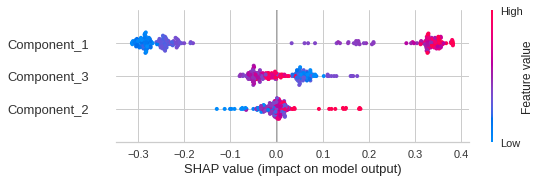

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [80]:
interpret_model(tuned_rf_pca, plot='summary')

In [81]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [82]:
interpret_model(tuned_rf_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
